### MISP - project

# Image Deconvolution with Tikhonov Regularization

Ghiotto Alessandro 513944  
Suardi Leonardo 516476


---

### Load the image

First we load our image. It is a grayscale image of size 512 x 512 pixels, with values normalized in [0, 1] 

Image shape:  (512, 512)
dtype: float64
min: 0.0 max: 1.0


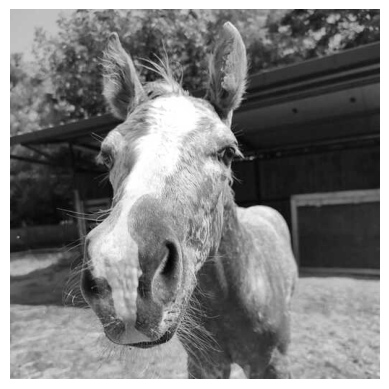

In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set_theme(style="darkgrid")
from scipy.signal import convolve2d
from scipy.fft import fft2, ifft2, fftshift
np.random.seed(42)

img = Image.open('images/horse.jpg').convert('L')  # 'L' mode for grayscale
img = np.array(img)
img = np.array(img) / img.max()  # Normalize to range [0, 1]

print("Image shape: ", img.shape)  # (height, width)
print("dtype:", img.dtype)  # float64
print("min:", img.min(), "max:", img.max())  # 0.0 1.0
plt.imshow(img, cmap='gray')
plt.axis("off")  # Remove axes for better visualization
# plt.colorbar()
plt.show()

## Direct Problem: Blurring

First we need to obtain the blurred and noisy image (g), from the original one (f)

$$
g = Af + w 
$$

$A$ is the convolution operator and $w$ is Gaussian noise sampled from $\mathcal{N}(\mu,\sigma^2)$, in our case we used $\sigma = 0.05$

We are going to use [scipy.fft.fft2](https://docs.scipy.org/doc/scipy/reference/generated/scipy.fft.fft2.html), [scipy.fft.ifft2](https://docs.scipy.org/doc/scipy/reference/generated/scipy.fft.ifft2.html#scipy.fft.ifft2) and [scipy.signal.convolve2d](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html)

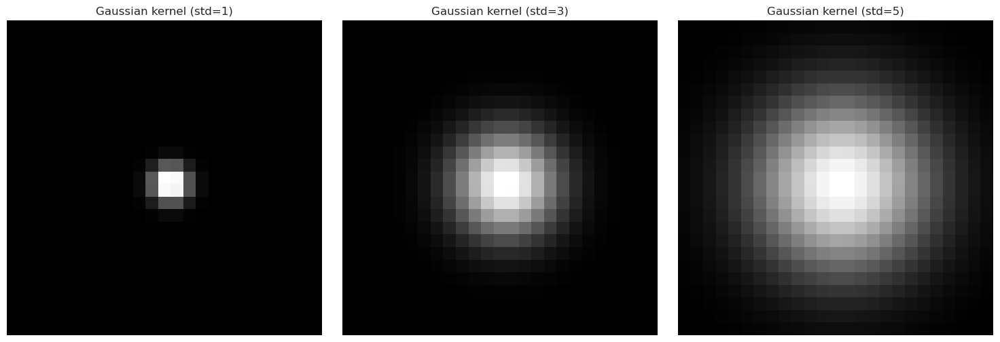

In [2]:
def gaussian_kernel(size=15, sigma=3):
    """
    Generate a Gaussian kernel.
        - size: Size of the kernel (must be odd).
        - sigma: Standard deviation of the Gaussian.
        
        return: Normalized 2D Gaussian kernel.
    """
    x = np.linspace(-size // 2, size // 2, size)
    y = np.linspace(-size // 2, size // 2, size)
    X, Y = np.meshgrid(x, y)
    kernel = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    return kernel / np.sum(kernel)  # Normalize the kernel to sum to 1

sigmas = [1, 3, 5]
kernels = [gaussian_kernel(size=25, sigma=s) for s in sigmas]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, (sigma, kernel) in enumerate(zip(sigmas, kernels)):
    axes[i].imshow(kernel, cmap='gray')
    axes[i].set_title(f"Gaussian kernel (std={sigma})")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

Now we blur the image and add the gaussian noise. The blurring is done by computing the convolution between the image and the kernel.

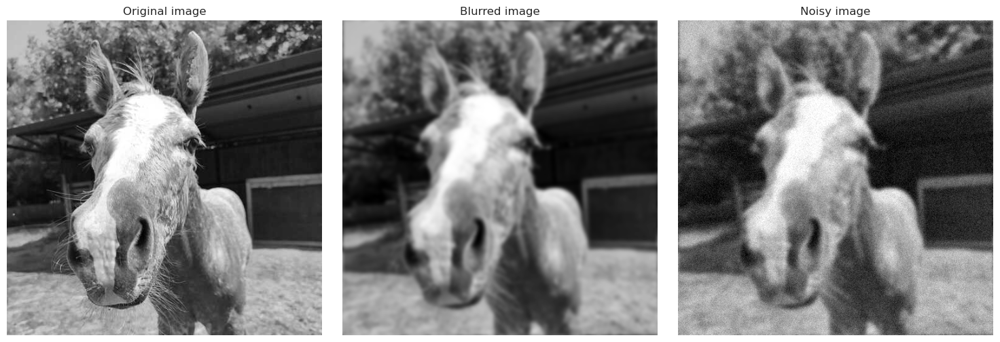

In [3]:
def apply_blur_convolve2d(image, kernel):
    """
    Apply Gaussian blur to the image using directly the convolution.
    return: Blurred image.
    """
    blurred = convolve2d(image, kernel, mode='same', boundary='wrap')
    return blurred

def add_gaussian_noise(image, sigma=0.05):
    """
    Add Gaussian noise to the image.
        - image: Blurred image.
        - sigma: Standard deviation of the Gaussian.
    
        return: Noisy image.
    """
    np.random.seed(42) # so we get always the same noise
    noise = np.random.normal(0, sigma, image.shape)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 1)  # Ensure pixel values are in [0, 1]

# blur
size = 15
sigma = 3
kernel = gaussian_kernel(size=size, sigma=sigma)
blurred_img = apply_blur_convolve2d(img, kernel)

# add noise
sigma = 0.05
noisy_img = add_gaussian_noise(blurred_img, sigma=sigma)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(blurred_img, cmap='gray')
axes[1].set_title("Blurred image")
axes[1].axis("off")

axes[2].imshow(noisy_img, cmap='gray')
axes[2].set_title("Noisy image")
axes[2].axis("off")

plt.tight_layout()
plt.show()

For blurring the image, we can also try to compute the product of the fourier transforms of the image and the kernel, and then get back the image with the inverse fourier transform.

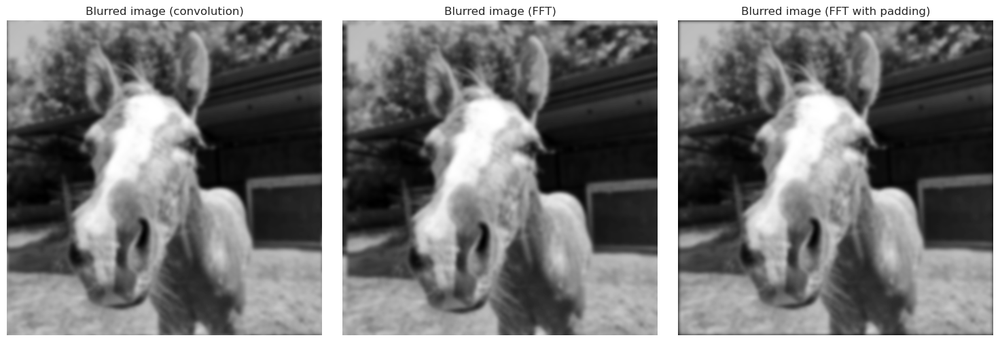

In [4]:
def apply_blur_fft(image, kernel):
    """
    Apply Gaussian blur to the image using the FFT.
    return: Blurred image.
    """
    # Compute the 2D FFT of the image and the kernel
    image_fft = fft2(image)
    kernel_fft = fft2(kernel, s=image.shape) # Pad the kernel to the image size

    # Perform the convolution in the frequency domain
    blurred_fft = image_fft * kernel_fft
    blurred = ifft2(blurred_fft).real

    blurred = np.clip(blurred, 0, 1)

    return blurred

def apply_blur_fft_with_padding(img, kernel):
    """
    Apply Gaussian blur to the image using the FFT.
    return: Blurred image.
    """
    # Get height and width of the image and kernel
    H, W = img.shape
    kH, kW = kernel.shape

    # Compute the new padded size
    pad_H = H + kH - 1
    pad_W = W + kW - 1

    # Zero-pad the image: add 0s to the right and bottom borders
    padded_image = np.zeros((pad_H, pad_W))
    padded_image[:H, :W] = img  # Place original image in top-left corner

    # Compute the 2D FFT of the padded image and kernel
    image_fft = fft2(padded_image)
    kernel_fft = fft2(kernel, s=padded_image.shape)

    # Perform the convolution in the frequency domain
    blurred_fft = image_fft * kernel_fft
    blurred_padded = ifft2(blurred_fft).real  # Convert back to spatial domain

    # Now we have a padded image with an extra border of size (kH // 2, kW // 2)
    # We need to remove this border to get the final blurred image (same size as original)
    delta_H = kH // 2
    delta_W = kW // 2
    blurred = blurred_padded[delta_H:delta_H+H, delta_W:delta_W+W]
    blurred = np.clip(blurred, 0, 1)
    return blurred

blurred_border = apply_blur_fft(img, kernel)
noisy_img_input = add_gaussian_noise(blurred_border, sigma=sigma) # this will be used as input for the deconvolution problem
blurred_padded = apply_blur_fft_with_padding(img, kernel)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(blurred_img, cmap='gray')
axes[0].set_title("Blurred image (convolution)")
axes[0].axis("off")

axes[1].imshow(blurred_border, cmap='gray')
axes[1].set_title("Blurred image (FFT)")
axes[1].axis("off")

axes[2].imshow(blurred_padded, cmap='gray')
axes[2].set_title("Blurred image (FFT with padding)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In the middle image we can see that a **"wrapped border"** appears in the upper left and top edges of the
image. This is because the padding is not done correctly, and does
not take the kernel size into account (so the convolution "flows out
of bounds of the image").

We will use the middle one as input for our deconvolve methods, this because this "wrapped border" will be fixed in the deconvolution phase. the first on the left instead is used to compute a PSNR value, to be compared with our future deconvolved images.

If we zero pad the image we fix this problem, and we just get a thin black border in the edges. this is given by the convolution with the zeros that we have added via padding.

Now we can plot the fourier transform of the image and the kernel.

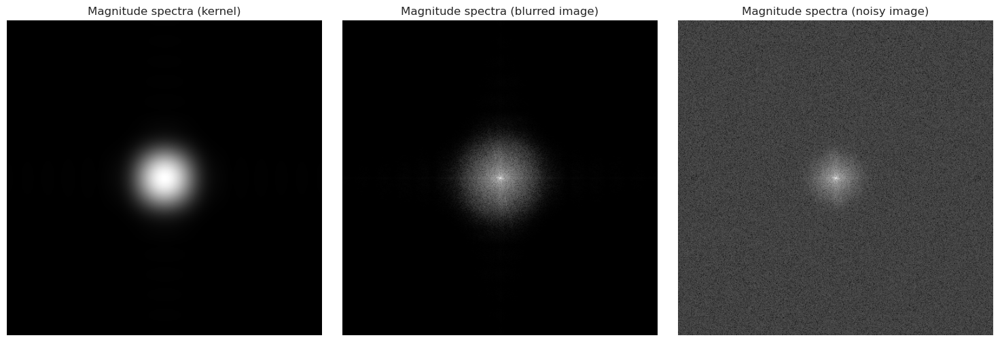

In [5]:
def get_magnitude_spectra(image, size=None):
    """
    Compute the magnitude spectra of the image.
        - image: Input image.
        - size: Size of the image (used to compute the magnitude spectra).
                if None, image.shape is used.
                it is needed when we have to compute the magnitude spectra of the kernel.
                
        return: Magnitude spectra of the image.
    """
    size = size if size is not None else image.shape

    # Compute the 2D FFT of the image
    img_ft = fft2(image, s=size)
    img_ft_shifted = fftshift(img_ft)  # Shift zero frequency to center

    # Compute magnitude spectra (log scale for better visualization)
    img_ft_magnitude = np.log(1 + np.abs(img_ft_shifted))
    return img_ft_magnitude
    
mag_blurred = get_magnitude_spectra(blurred_img)
mag_noisy = get_magnitude_spectra(noisy_img)
mag_kernel = get_magnitude_spectra(kernel, size=img.shape)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(mag_kernel, cmap='gray')
axes[0].set_title("Magnitude spectra (kernel)")
axes[0].axis("off")

axes[1].imshow(mag_blurred, cmap='gray')
axes[1].set_title("Magnitude spectra (blurred image)")
axes[1].axis("off")

axes[2].imshow(mag_noisy, cmap='gray')
axes[2].set_title("Magnitude spectra (noisy image)")
axes[2].axis("off")

plt.tight_layout()
plt.show()


## Inverse problem: Deblurring

In [6]:
### UTILITY FUNCTIONS ###

def psnr(original, reconstructed):
    """Compute Peak Signal-to-Noise Ratio (PSNR)."""
    mse = np.mean((original - reconstructed) ** 2)
    max_pixel = np.max(original)
    return 20 * np.log10(max_pixel**2 / mse)

def plot_deconvolved_images(original_img, noisy_img, noisy_img_input, kernel, mu_values, deconvolve_method, deconvolve_method_str="", param_name="μ"):
    """
    Plot the deconvolved images for different mu values.
        - original_img: Original image.
        - noisy_img: Noisy image.
        - noisy_img_input: Noisy image used as input for the deconvolution problem.
                           The one with the "wrapped border" in the top left
        - kernel: kernel used to blurr the image.
        - mu_values: List of mu values to test.
        - deconvolve_method: Function to deconvolve the image.
        - deconvolve_method_str: Name of the deconvolution method (L2 or H1 for the title).
        - param_name: Name of the parameter (μ) for the title.

        return: List of PSNR values for each mu.
    """

    n_imgs = len(mu_values) + 1
    fig, axes = plt.subplots(1, n_imgs, figsize=(15, 5))

    psnr_values = []
    # Plot deblurred images for different μ values
    for i, mu in enumerate(mu_values):
        restored = deconvolve_method(noisy_img_input, kernel, mu)
        
        # Compute PSNR
        psnr_val = psnr(original_img, restored)
        psnr_values.append(psnr_val)
        
        # Display restored image
        axes[i].imshow(restored, cmap="gray")
        axes[i].set_title(f"{deconvolve_method_str} - {param_name} = {mu}\nPSNR = {psnr_val:.2f}")
        axes[i].axis("off")

    # Plot noisy blurred image in the lastt column
    psnr_val = psnr(original_img, noisy_img)
    axes[-1].imshow(noisy_img, cmap="gray")
    axes[-1].set_title(f"Noisy image\nPSNR = {psnr_val:.2f}")
    axes[-1].axis("off")

    plt.tight_layout()
    plt.show()

    return psnr_values

def plot_psnr_vs_mu(mu_values, psnr_values_L2, psnr_values_H1):
    """
    Plot PSNR vs. μ for the deconvolution methods.
        - mu_values: List of mu values.
        - psnr_values_L2: List of PSNR values for L2 regularization.
        - psnr_values_H1: List of PSNR values for H1 regularization.
    """
    # print best mu
    print(f"Best μ for L2 regularization: {mu_values[np.argmax(psnr_values_L2)]}, PSNR = {np.max(psnr_values_L2):.2f}")
    print(f"Best μ for H1 regularization: {mu_values[np.argmax(psnr_values_H1)]}, PSNR = {np.max(psnr_values_H1):.2f}")
        
    plt.figure(figsize=(13, 4))

    # Plot L2 regularization PSNR values
    sns.lineplot(x=mu_values, y=psnr_values_L2, marker="s", linestyle="--", linewidth=2.5, markersize=8, label="L2 Regularization")

    # Plot H1 regularization PSNR values
    sns.lineplot(x=mu_values, y=psnr_values_H1, marker="o", linestyle="--", linewidth=2.5, markersize=8, label="H1 Regularization")

    plt.xscale("log")
    plt.xlabel("Regularization parameter μ")
    plt.ylabel("PSNR")
    plt.title("PSNR vs. μ for L2 and H1 Regularization")
    plt.legend()
    plt.show()

    return None


def compare_images(original, noisy, reconstructed, param_val_str="", method_str="", param_name="μ"):
    """
    Compare the original, noisy, and reconstructed images.
        - original: Original image.
        - noisy: Noisy image.
        - reconstructed: Reconstructed image.
        - param_val_str: Value of the parameter (μ) for the title.
        - method_str: Name of the deconvolution method for the title.
        - param_name: Name of the parameter (μ) for the title.
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original image")
    axes[0].axis("off")

    psnr_val = psnr(original, noisy)
    axes[1].imshow(noisy, cmap='gray')
    axes[1].set_title(f"Noisy image\nPSNR = {psnr_val:.2f}")
    axes[1].axis("off")

    psnr_val = psnr(original, reconstructed)
    axes[2].imshow(reconstructed, cmap='gray')
    axes[2].set_title(f"Reconstructed ({method_str} - {param_name} = {param_val_str})\nPSNR = {psnr_val:.2f}")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    return None

**Deconvolution with $L^2$ Regularization**

The solution of the following minimization problem:

$$
\min_f \| Af - g \|^2 + \mu \| f \|^2
$$

Is given by: 

$$
\hat{f_\mu} = \frac{\overline{\hat{K}} \hat{g}}{|\hat{K}|^2 + \mu}
$$

We get the FT of the denoised image from the FT of the Kernel and the noised image. With the Inverse FT then we get the reconstructed image.

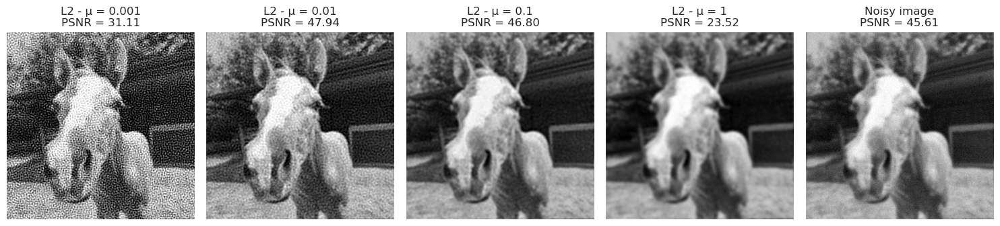

In [7]:
def deconvolve_L2(img, kernel, mu):
    """
    Perform L2 regularization deconvolution

        - input_img: Noisy image.
        - kernel: Blur kernel.
        - mu: Regularization parameter.

        return: Deconvolved image.
    """
    # fft2: compute the fourier transform
    g_hat = fft2(img)
    k_hat = fft2(kernel, s=img.shape) # s=img.shape pad kernel to match image size
    f_hat =  np.conj(k_hat) * g_hat/ (np.abs(k_hat) ** 2 + mu)

    # convert the deconvolved image back to the spatial domain
    deconvolved_img = ifft2(f_hat).real
    deconvolved_img = np.clip(deconvolved_img, 0, 1)

    return deconvolved_img

# Test different mu values
mu_values = [1e-3, 1e-2, 1e-1, 1]
psnr_values_L2 = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, mu_values, deconvolve_L2, deconvolve_method_str="L2")

Lower mu values recover more details but amplify noise. Higher mu values suppress noise but oversmooth the image.

**Deconvolution with $H^1$ Regularization**

The solution of the following minimization problem:

$$
\min_f \| Af - g \|^2 + \mu \left( \| f \|^2 + \| \nabla f \|^2 \right)
$$

Is given by: 

$$
\hat{f_\mu} = \frac{\overline{\hat{K}} \hat{g}}{|\hat{K}|^2 + \mu (1 + |\omega_1|^2 + |\omega_2|^2)}
$$

We get the FT of the denoised image from the FT of the Kernel and the noised image, and also the spacial frequency variables $\omega_1$ and $\omega_2$.

The spacial frequency variable are obtained with [numpy.fft.fftfreq](https://numpy.org/doc/stable/reference/generated/numpy.fft.fftfreq.html), wich returns the Discrete Fourier Transform sample frequencies, given the image size. We can see them below in the plot.

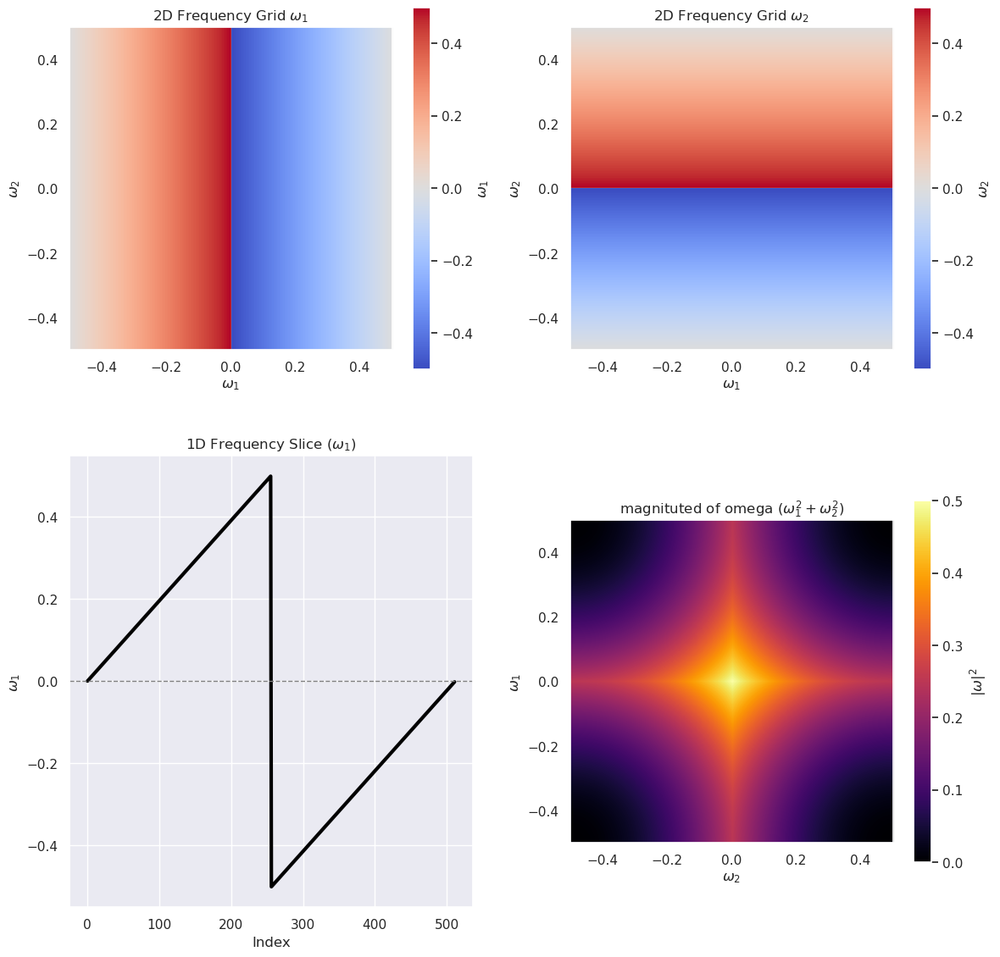

In [8]:
H, W = img.shape

omega1_vals = np.fft.fftfreq(H)  # 1D frequency components along height
omega2_vals = np.fft.fftfreq(W)  # 1D frequency components along width
omega1, omega2 = np.meshgrid(omega2_vals, omega1_vals)  # Create 2D grid
omega_squared_sum = omega1**2 + omega2**2  # magnitute |omega|^2

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# 2D grid for omega1
im1 = axes[0, 0].imshow(omega1, cmap="coolwarm", extent=[-0.5, 0.5, -0.5, 0.5])
axes[0, 0].set_xlabel(r"$\omega_1$")
axes[0, 0].set_ylabel(r"$\omega_2$")
axes[0, 0].set_title(r"2D Frequency Grid $\omega_1$")
fig.colorbar(im1, ax=axes[0, 0], label=r"$\omega_1$", shrink=0.8)
axes[0, 0].grid(False)

# 2D grid for omega2
im2 = axes[0, 1].imshow(omega2, cmap="coolwarm", extent=[-0.5, 0.5, -0.5, 0.5])
axes[0, 1].set_xlabel(r"$\omega_1$")
axes[0, 1].set_ylabel(r"$\omega_2$")
axes[0, 1].set_title(r"2D Frequency Grid $\omega_2$")
fig.colorbar(im2, ax=axes[0, 1], label=r"$\omega_2$", shrink=0.8)
axes[0, 1].grid(False)

# 1D slice of omega1
sns.lineplot(x=range(len(omega1_vals)), y=omega1_vals, ax=axes[1, 0], color="black", linewidth=3)
axes[1, 0].set_xlabel(r"Index")
axes[1, 0].set_ylabel(r"$\omega_1$")
axes[1, 0].set_title(r"1D Frequency Slice ($\omega_1$)")
axes[1, 0].axhline(0, color="gray", linestyle="--", lw=1)
axes[1, 0].grid(True)

# magnituted of the omega |omega|
im4 = axes[1, 1].imshow(omega_squared_sum, cmap="inferno", extent=[-0.5, 0.5, -0.5, 0.5])
axes[1, 1].set_xlabel(r"$\omega_2$")
axes[1, 1].set_ylabel(r"$\omega_1$")
axes[1, 1].set_title(r"magnituted of omega $(\omega_1^2 + \omega_2^2)$")
fig.colorbar(im4, ax=axes[1, 1], label=r"$|\omega|^2$", shrink=0.8)
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()


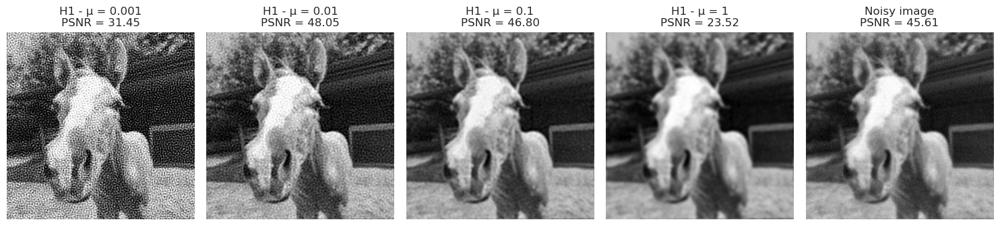

In [9]:
# H1-regularized deconvolution function
def deconvolve_H1(img, kernel, mu):
    """
    Perform H1 regularization deconvolution.

        - img: Noisy image.
        - kernel: Blur kernel.
        - mu: Regularization parameter.

        return: Deconvolved image.
    """
    g_hat = fft2(img)
    k_hat = fft2(kernel, s=img.shape)

    # Get spatial frequency grid
    H, W = img.shape
    omega1, omega2 = np.meshgrid(np.fft.fftfreq(W), np.fft.fftfreq(H))

    # compute the deconvolved img (in frequency domain)
    denominator = np.abs(k_hat)**2 + mu * (1 + omega1**2 + omega2**2)
    f_hat = (np.conj(k_hat) * g_hat) / denominator

    # Convert deconvolved image back to spatial domain
    deconvolved_img = ifft2(f_hat).real 
    deconvolved_img = np.clip(deconvolved_img, 0, 1)
    return deconvolved_img

# Test different mu values
mu_values = [1e-3, 1e-2, 1e-1, 1]
psnr_values_H1 = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, mu_values, deconvolve_H1, deconvolve_method_str="H1")

Best μ for L2 regularization: 0.01, PSNR = 47.94
Best μ for H1 regularization: 0.01, PSNR = 48.05


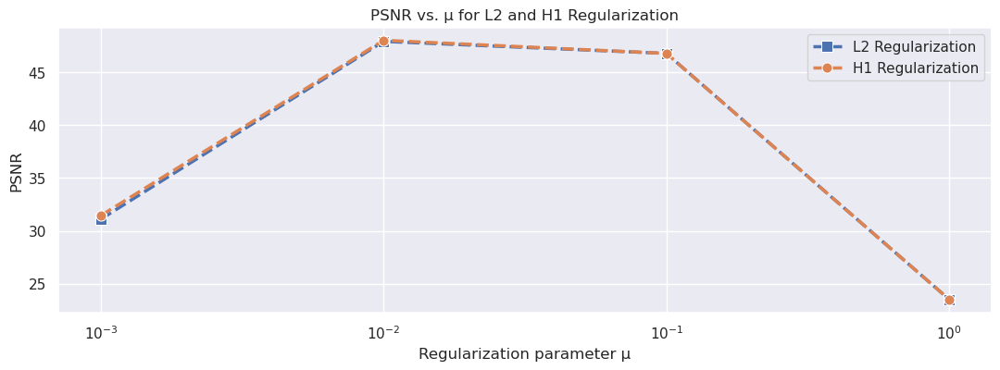

Best reconstructed image


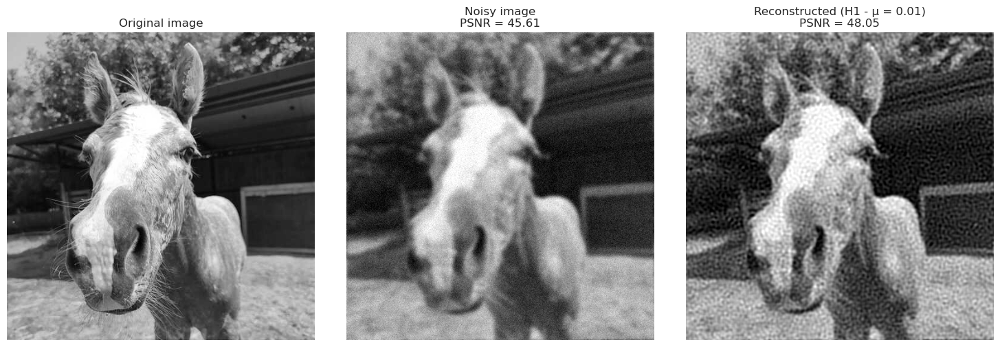

In [10]:
plot_psnr_vs_mu(mu_values, psnr_values_L2, psnr_values_H1)

best_mu = 0.01
best_reconstructed = deconvolve_H1(noisy_img_input, kernel, best_mu)
print("Best reconstructed image")
compare_images(img, noisy_img, best_reconstructed, param_val_str=str(best_mu), method_str="H1")

$L^2$ and $H^1$ regularization get very similar results, with the best mu given by $\mu = 10^{-2}$

Now we plot the slice of the images for different values of $\mu$, so we can see better the effect of the regularization parameter.

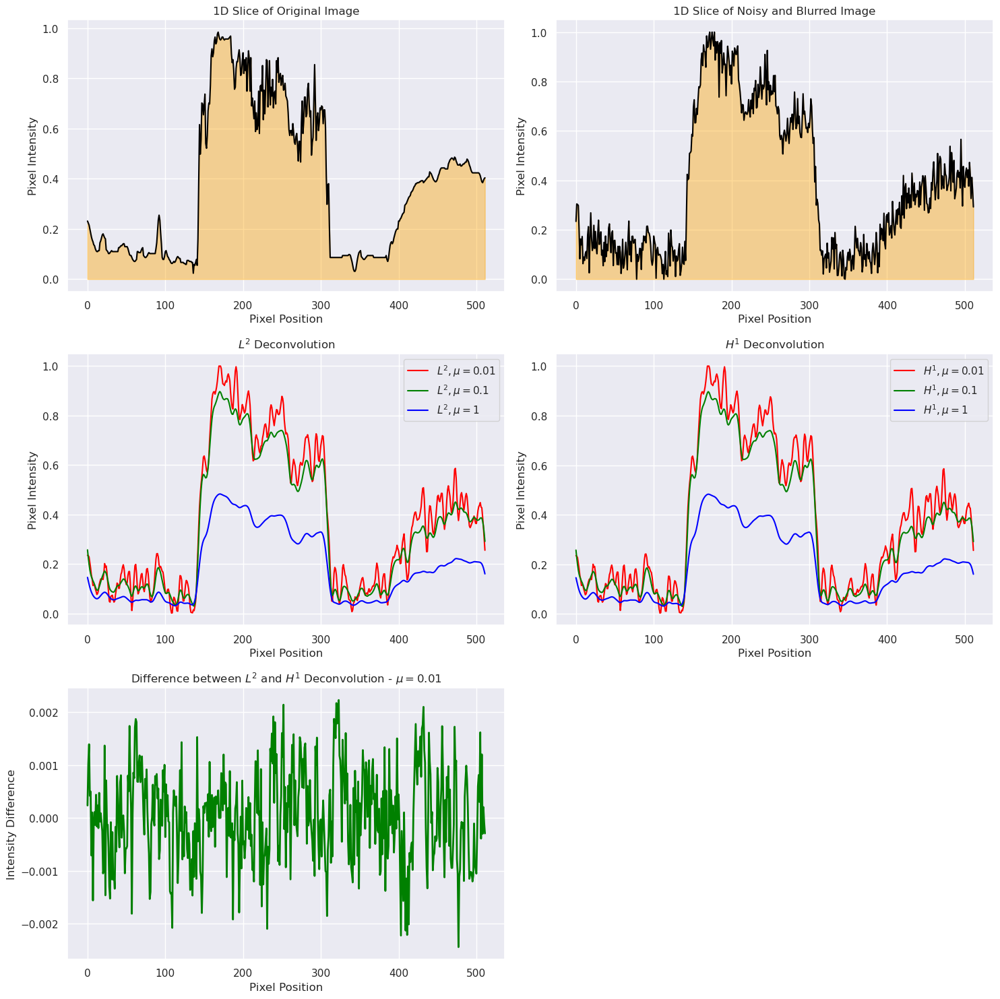

In [31]:
# deconvolved imgs
deconv_L2_mu1 = deconvolve_L2(noisy_img_input, kernel, mu=0.01)
deconv_L2_mu2 = deconvolve_L2(noisy_img_input, kernel, mu=0.1)
deconv_L2_mu3 = deconvolve_L2(noisy_img_input, kernel, mu=1)
deconv_H1_mu1 = deconvolve_H1(noisy_img_input, kernel, mu=0.01)
deconv_H1_mu2 = deconvolve_H1(noisy_img_input, kernel, mu=0.1)
deconv_H1_mu3 = deconvolve_H1(noisy_img_input, kernel, mu=1)

# slice
slice_idx = H // 2  

slice_original_img = img[slice_idx, :]
slice_noisy_img = noisy_img[slice_idx, :]
slice_L2_mu1 = deconv_L2_mu1[slice_idx, :]
slice_L2_mu2 = deconv_L2_mu2[slice_idx, :]
slice_L2_mu3 = deconv_L2_mu3[slice_idx, :]
slice_H1_mu1 = deconv_H1_mu1[slice_idx, :]
slice_H1_mu2 = deconv_H1_mu2[slice_idx, :]
slice_H1_mu3 = deconv_H1_mu3[slice_idx, :]
diff = slice_L2_mu1 - slice_H1_mu1

################# PLOT
fig, axes = plt.subplots(3, 2, figsize=(15, 15))

x_vals = np.arange(W)  # Pixel positions along the row

# ---- (1) Plot Original Image Slice ----
sns.lineplot(x=x_vals, y=slice_original_img, ax=axes[0, 0], color="black")
axes[0, 0].fill_between(x_vals, slice_original_img, color="orange", alpha=0.4)
axes[0, 0].set_xlabel("Pixel Position")
axes[0, 0].set_ylabel("Pixel Intensity")
axes[0, 0].set_title("1D Slice of Original Image")

# ---- (2) Plot Noisy and Blurred Image Slice ----
sns.lineplot(x=x_vals, y=slice_noisy_img, ax=axes[0, 1], color="black")
axes[0, 1].fill_between(x_vals, slice_noisy_img, color="orange", alpha=0.4)
axes[0, 1].set_xlabel("Pixel Position")
axes[0, 1].set_ylabel("Pixel Intensity")
axes[0, 1].set_title("1D Slice of Noisy and Blurred Image")

# ---- (3) Plot L2 Deconvolution Slices ----
axes[1, 0].plot(x_vals, slice_L2_mu1, label=r"$L^2, \mu=0.01$", linestyle="-", color="red", linewidth=1.5)
axes[1, 0].plot(x_vals, slice_L2_mu2, label=r"$L^2, \mu=0.1$", linestyle="-", color="green", linewidth=1.5)
axes[1, 0].plot(x_vals, slice_L2_mu3, label=r"$L^2, \mu=1$", linestyle="-", color="blue", linewidth=1.5)
axes[1, 0].set_xlabel("Pixel Position")
axes[1, 0].set_ylabel("Pixel Intensity")
axes[1, 0].set_title(r"$L^2$ Deconvolution")
axes[1, 0].legend()
axes[1, 0].grid(True)

# ---- (4) Plot H1 Deconvolution Slices ----
axes[1, 1].plot(x_vals, slice_H1_mu1, label=r"$H^1, \mu=0.01$", linestyle="-", color="red", linewidth=1.5)
axes[1, 1].plot(x_vals, slice_H1_mu2, label=r"$H^1, \mu=0.1$", linestyle="-", color="green", linewidth=1.5)
axes[1, 1].plot(x_vals, slice_H1_mu3, label=r"$H^1, \mu=1$", linestyle="-", color="blue", linewidth=1.5)
axes[1, 1].set_xlabel("Pixel Position")
axes[1, 1].set_ylabel("Pixel Intensity")
axes[1, 1].set_title(r"$H^1$ Deconvolution")
axes[1, 1].legend()
axes[1, 1].grid(True)

# ---- (5) Plot Differences (L2 - H1) ----
axes[2, 0].plot(x_vals, diff, label=r"$L^2 - H^1$", linestyle="-", color="green", linewidth=2)
axes[2, 0].set_xlabel("Pixel Position")
axes[2, 0].set_ylabel("Intensity Difference")
axes[2, 0].set_title(r"Difference between $L^2$ and $H^1$ Deconvolution - $\mu=0.01$")

# ---- (6) Empty Plot for Symmetry ----
axes[2, 1].axis("off")

plt.tight_layout()
plt.show()

- 1° row: original img vs blurred img. we can see the effect of the noise, that creates this high ups and downs in the plot.
- 2° row: deconvolved imgs for different $\mu$. the higher the $\mu$, the smaller the norm of the function (that in our case is the slice of the image).
- 3° row: difference between $L^2$ abd $H^1$. the difference is small.

---

# Trying other blurring methods

### Linear motion blur

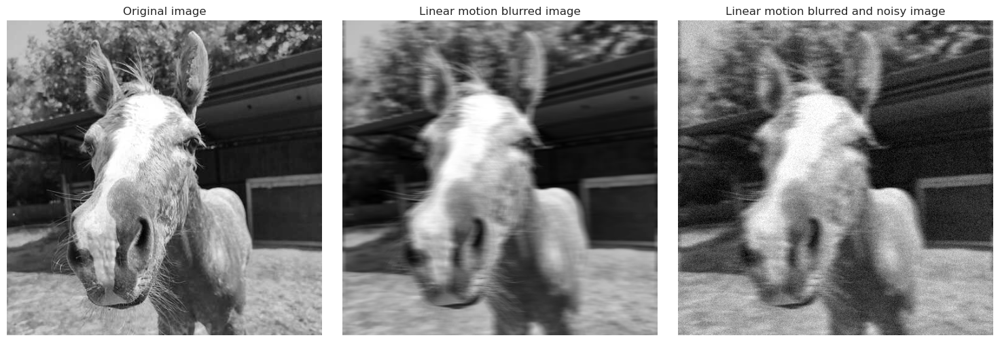

In [12]:
# Create a Linear Motion Blur Kernel
def motion_blur_kernel(size=15):
    """
    Create a linear motion blur kernel.
        - size: Size of the kernel (must be odd).
        - angle: Direction of motion in degrees (0 = horizontal).
        
        return: Motion blur kernel.
    """
    kernel = np.zeros((size, size))
    center = size // 2
    kernel[center, :] = 1.0

    return kernel / np.sum(kernel)

size = 15
sigma = 0.05
lin_kernel = motion_blur_kernel(size=size)
blurred_img = apply_blur_convolve2d(img, lin_kernel)
noisy_img = add_gaussian_noise(blurred_img, sigma=sigma)

noisy_img_input = add_gaussian_noise(apply_blur_fft(img, lin_kernel), sigma=sigma)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(blurred_img, cmap='gray')
axes[1].set_title("Linear motion blurred image")
axes[1].axis("off")

axes[2].imshow(noisy_img, cmap='gray')
axes[2].set_title("Linear motion blurred and noisy image")
axes[2].axis("off")

plt.tight_layout()
plt.show()

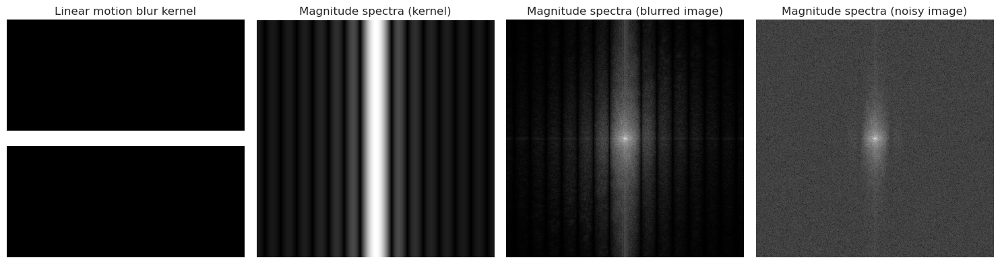

In [13]:
mag_blurred = get_magnitude_spectra(blurred_img)
mag_noisy = get_magnitude_spectra(noisy_img)
mag_kernel = get_magnitude_spectra(lin_kernel, size=img.shape)

fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(lin_kernel, cmap='gray')
axes[0].set_title("Linear motion blur kernel")
axes[0].axis("off")

axes[1].imshow(mag_kernel, cmap='gray')
axes[1].set_title("Magnitude spectra (kernel)")
axes[1].axis("off")

axes[2].imshow(mag_blurred, cmap='gray')
axes[2].set_title("Magnitude spectra (blurred image)")
axes[2].axis("off")

axes[3].imshow(mag_noisy, cmap='gray')
axes[3].set_title("Magnitude spectra (noisy image)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

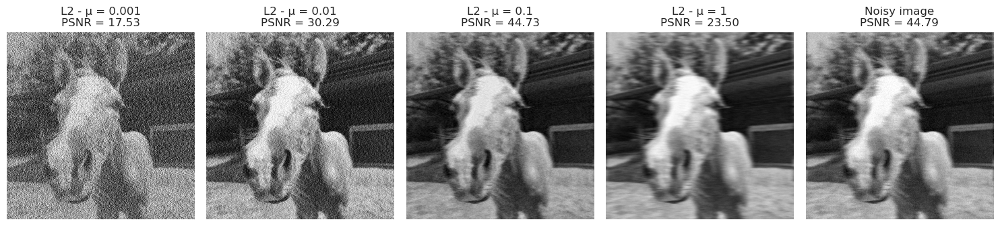

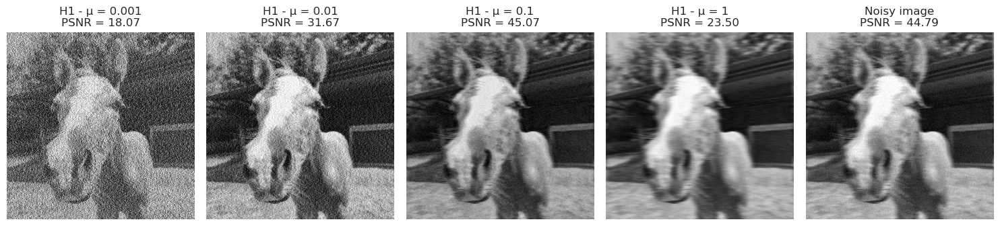

Best μ for L2 regularization: 0.1, PSNR = 44.73
Best μ for H1 regularization: 0.1, PSNR = 45.07


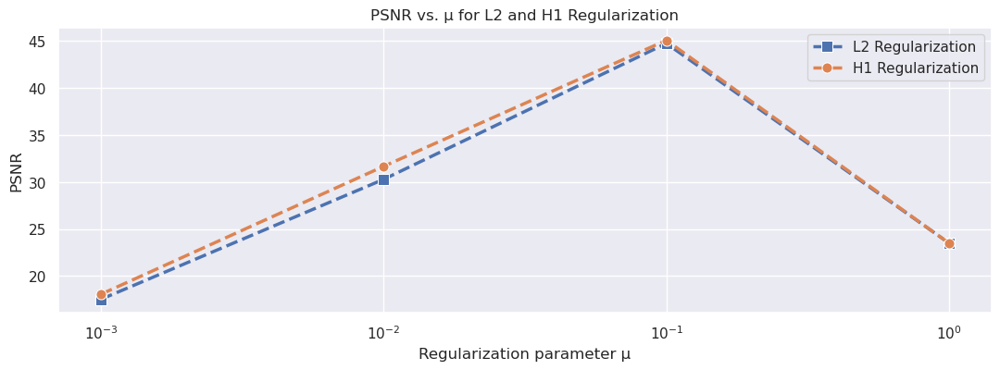

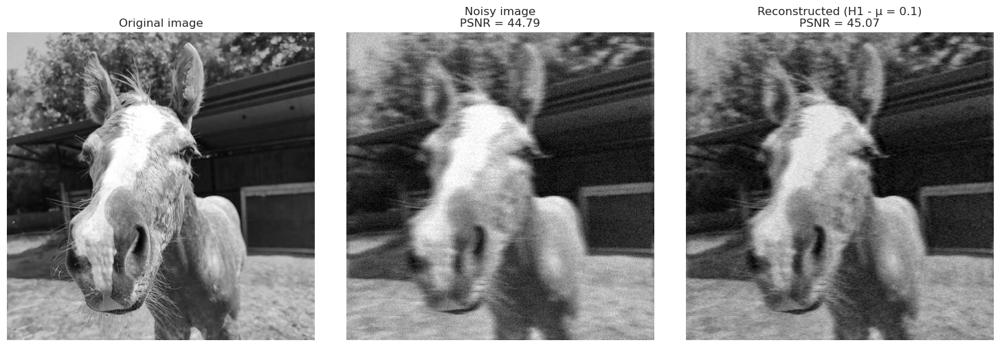

In [14]:
mu_values = [1e-3, 1e-2, 1e-1, 1]

psnr_values_L2 = plot_deconvolved_images(img, noisy_img, noisy_img_input, lin_kernel, mu_values, deconvolve_L2, deconvolve_method_str="L2")
psnr_values_H1 = plot_deconvolved_images(img, noisy_img, noisy_img_input, lin_kernel, mu_values, deconvolve_H1, deconvolve_method_str="H1")

plot_psnr_vs_mu(mu_values, psnr_values_L2, psnr_values_H1)

best_mu = 0.1
best_reconstructed = deconvolve_H1(noisy_img_input, lin_kernel, best_mu)
compare_images(img, noisy_img, best_reconstructed, param_val_str=str(best_mu), method_str="H1")

The linear motion blur gets higher PSNR value with $\mu = 10^{-1}$, instead for the gaussian blur we had that the best mu was $\mu = 10^{-2}$

### Out-of-focus blur

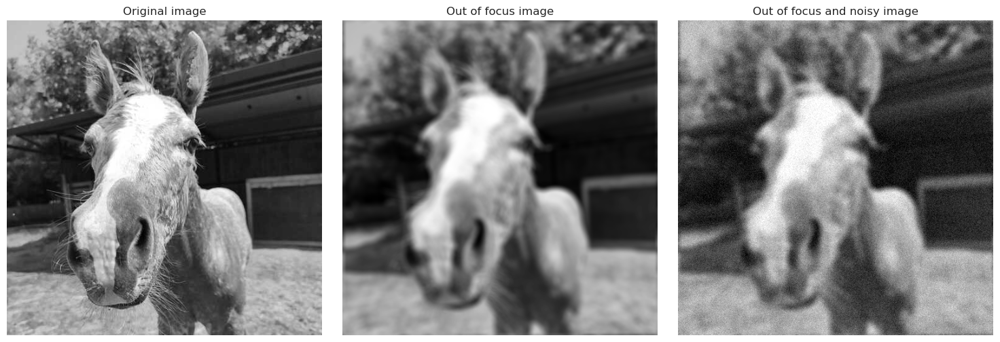

In [15]:
# Function to create a circular kernel for the out-of-focus blur
def out_of_focus_blur_kernel(D, size):
    # Create a meshgrid for the kernel (size x size)
    y, x = np.ogrid[-size//2:size//2, -size//2:size//2]
    
    # Calculate the distance from the center
    distance = x**2 + y**2
    
    # Generate the kernel based on the disk shape (circle of confusion)
    kernel = np.where(distance <= (D/2)**2, 1, 0)

    return kernel / np.sum(kernel)

# Parameters for the out-of-focus blur
D = 13  # Diameter of the circle of confusion
size = 25
sigma = 0.05

oof_kernel = out_of_focus_blur_kernel(D, size)
blurred_img = apply_blur_convolve2d(img, oof_kernel)
noisy_img = add_gaussian_noise(blurred_img, sigma=sigma)

noisy_img_input = add_gaussian_noise(apply_blur_fft(img, oof_kernel), sigma=sigma)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(blurred_img, cmap='gray')
axes[1].set_title("Out of focus image")
axes[1].axis("off")

axes[2].imshow(noisy_img, cmap='gray')
axes[2].set_title("Out of focus and noisy image")
axes[2].axis("off")

plt.tight_layout()
plt.show()

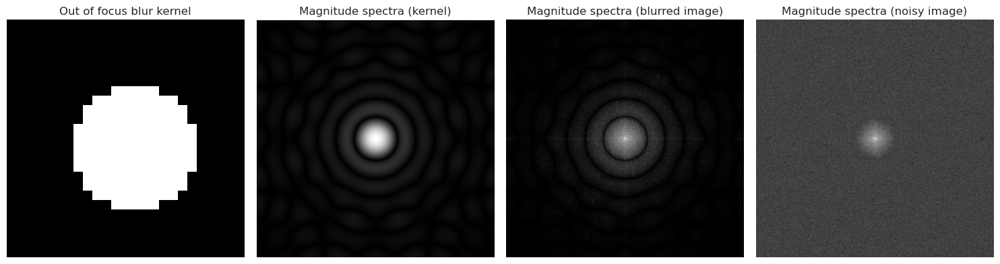

In [16]:
mag_blurred = get_magnitude_spectra(blurred_img)
mag_noisy = get_magnitude_spectra(noisy_img)
mag_kernel = get_magnitude_spectra(oof_kernel, size=img.shape)

fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(oof_kernel, cmap='gray')
axes[0].set_title("Out of focus blur kernel")
axes[0].axis("off")

axes[1].imshow(mag_kernel, cmap='gray')
axes[1].set_title("Magnitude spectra (kernel)")
axes[1].axis("off")

axes[2].imshow(mag_blurred, cmap='gray')
axes[2].set_title("Magnitude spectra (blurred image)")
axes[2].axis("off")

axes[3].imshow(mag_noisy, cmap='gray')
axes[3].set_title("Magnitude spectra (noisy image)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

In the noisy image the spectrum is almost identical to the gaussian one

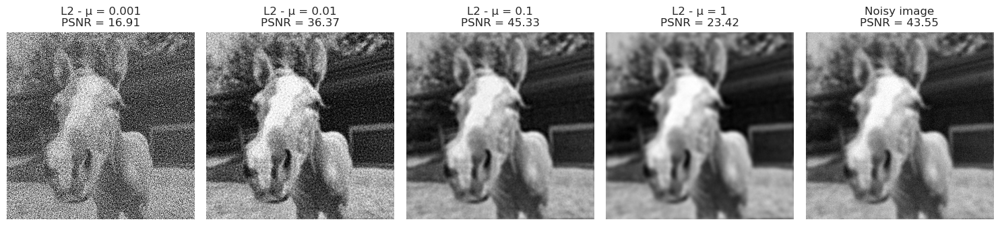

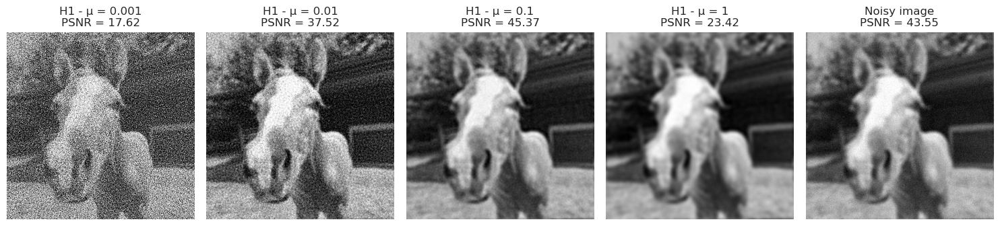

Best μ for L2 regularization: 0.1, PSNR = 45.33
Best μ for H1 regularization: 0.1, PSNR = 45.37


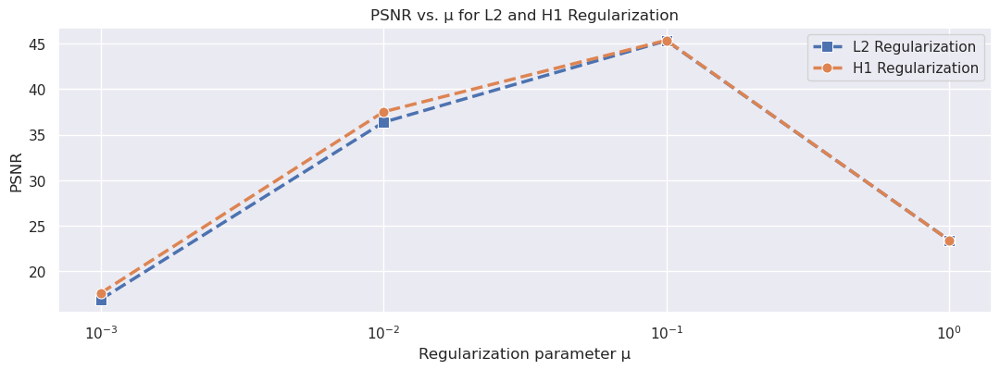

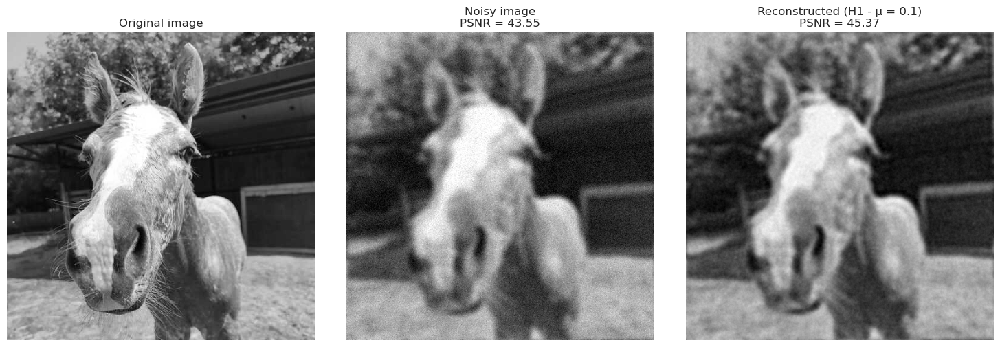

In [17]:
mu_values = [1e-3, 1e-2, 1e-1, 1]

psnr_values_L2 = plot_deconvolved_images(img, noisy_img, noisy_img_input, oof_kernel, mu_values, deconvolve_L2, deconvolve_method_str="L2")
psnr_values_H1 = plot_deconvolved_images(img, noisy_img, noisy_img_input, oof_kernel, mu_values, deconvolve_H1, deconvolve_method_str="H1")

plot_psnr_vs_mu(mu_values, psnr_values_L2, psnr_values_H1)

best_mu = 0.1
best_reconstructed = deconvolve_H1(noisy_img_input, oof_kernel, best_mu)
compare_images(img, noisy_img, best_reconstructed, param_val_str=str(best_mu), method_str="H1")

---

# Window functions

Any function satifying the following three properties defines a regularization procedure:
1. $$|\hat{W}_\mu(\omega)| \le 1, \forall\mu>0 $$
2. $$\lim_{\mu\to0} \hat{W}_\mu(\omega) = 1, \forall\mu \text{ s.t. } \hat{K}(\omega) \ne 0$$
3. $$\frac{\hat{W}_\mu(\omega)}{\hat{K}(\omega)} \text{ is bounded,} \forall\mu>0 $$


For comparison we will plot also the window functions that gives the corresponding results to the $L^2$ and $H^1$ regularization:

- **$L^2$ Window**
  
$$
\hat{W}_\mu(\omega) = \frac{|\hat{K}(\omega)|^2}{|\hat{K}(\omega)|^2 + \mu}
$$

- **$H^1$ Window**
  
$$
\hat{W}_\mu(\omega) = \frac{|\hat{K}(\omega)|^2}{|\hat{K}(\omega)|^2 + \mu (1 + |\omega|^2)}
$$

Then we have implemented the following window functions:

-  **Truncated Window** (Miller Regularization)

$$
\hat{W}_\mu(\omega) =
\begin{cases}
1, & \text{if } |\hat{K}(\omega)| > \sqrt{\mu}, \\
0, & \text{otherwise}.
\end{cases}
$$

-  **Rectangular Window**

$$
\hat{W}_\Omega(\omega) =
\begin{cases}
1, & \text{if } |\omega| < \Omega, \\
0, & \text{otherwise}.
\end{cases}
$$

- **Triangular Window**

$$
\hat{W}_\Omega(\omega) =
\begin{cases}
1 - \frac{|\omega|}{\Omega}, & \text{if } |\omega| < \Omega, \\
0, & \text{otherwise}.
\end{cases}
$$

- **Generalized Hamming Window**

$$
\hat{W}_\Omega(\omega) =
\begin{cases}
\alpha + (1 - \alpha) \cos \left( \frac{\pi \omega}{\Omega} \right), & \text{if } |\omega| < \Omega, \\
0, & \text{otherwise}.
\end{cases}
$$

&nbsp;&nbsp;&nbsp; where $\alpha$ is a parameter (we set $\alpha = 0.54$).

- **Gaussian Window**
    
$$
\hat{W}_\Omega(\omega) = \exp \left( - \frac{1}{2} \left(\frac{\omega}{\Omega}\right)^2 \right).
$$

From the window functions we get back the FT of the deconvolved image by applying the following formula:

$$
\hat{f_\Omega} = \hat{W}_\Omega \cdot \frac{\hat{g}}{\hat{K}}
$$

In general higher $\Omega$ values means that we are keeping also higher frequencies $\omega$, so we get sharper but noiser images. Instead $\mu$ is the same as before, is the regularization coefficient, the higher $\mu$ the higher the regularization so the smoother the function.

In [18]:
# we go back to the gaussian blur
size = 15
sigma_kernel = 3
sigma_noise = 0.05
kernel = gaussian_kernel(size=size, sigma=sigma_kernel)
noisy_img = add_gaussian_noise(apply_blur_convolve2d(img, kernel), sigma=sigma_noise)
noisy_img_input = add_gaussian_noise(apply_blur_fft(img, kernel), sigma=sigma_noise)

In [19]:
# The truncated window (Miller Regularization) is done separately from the other window functions
# Its here together with the ones corresponding to L2 and H1 regularization
# This window functions take as input the k_hat, not the omegas

def truncated_window_function(K_hat, mu):
    """Truncated window function"""
    # Keeps frequencies where |K_hat| > sqrt(mu)
    W = np.zeros_like(K_hat)
    W[np.abs(K_hat) > np.sqrt(mu)] = 1
    return W

def L2_window(k_hat, mu):
    """window corresponding to L2 regularization"""
    L2_window = np.abs(k_hat) ** 2 / (np.abs(k_hat) ** 2 + mu)
    return L2_window

def H1_window(k_hat, mu):
    """window corresponding to H1 regularization"""
    # Get spatial frequency grid
    H, W = img.shape
    omega1, omega2 = np.meshgrid(np.fft.fftfreq(W), np.fft.fftfreq(H))

    # compute the deconvolved img (in frequency domain)
    denominator = np.abs(k_hat)**2 + mu * (1 + omega1**2 + omega2**2)
    H1_window = np.abs(k_hat) ** 2 / denominator

    return H1_window

# -------------------- General Deconvolution Method --------------------

def deconvolve_with_kernel_window(g, K, mu, window_function):
    """
    Performs deconvolution using the window function.
    This method is used for window functions that depend on the kernel K_hat.
        - g: Noisy image.
        - K: Blur kernel.
        - mu: Regularization parameter.
        - window_function: Window function to apply, this is a function of the k_hat.

        return: Deconvolved image.
    """
    g_hat = fft2(g)
    K_hat = fft2(K, s=g.shape)

    # Apply the truncated window function
    W = window_function(K_hat, mu)
    f_hat = W * (g_hat / (K_hat + 1e-8))  # Avoid division by zero
    f_reconstructed = ifft2(f_hat).real
    return f_reconstructed


In [20]:
# Here we have the other window functions
# and below, the corresponding method for deconvolution

def rectangular_window(omega1, omega2, big_omega):
    """Rectangular window"""
    omega_mag = np.sqrt(omega1**2 + omega2**2)  # Compute |omega|
    W = (omega_mag < big_omega).astype(float)  # 1 if |omega| < big_omega, else 0
    return W

def triangular_window(omega1, omega2, big_omega):
    """Triangular window"""
    omega_mag = np.sqrt(omega1**2 + omega2**2)
    W = np.maximum(1 - omega_mag / big_omega, 0)
    return W

def generalized_hamming_window(omega1, omega2, big_omega, alpha=0.54):
    """Generalized Hamming window"""
    omega_mag = np.sqrt(omega1**2 + omega2**2)  # Compute |omega|

    W = np.zeros_like(omega_mag)
    mask = omega_mag < big_omega # 1 if |omega| < big_omega, else 0

    # for the values satisfying the condition we apply the formula (the rest will remain 0)
    W[mask] = alpha + (1 - alpha) * np.cos(np.pi * omega_mag[mask] / big_omega)
    return W

def gaussian_window(omega1, omega2, big_omega):
    """Gaussian window function"""
    omega_mag = np.sqrt(omega1**2 + omega2**2)
    W = np.exp(- (omega_mag**2) / (2 * big_omega**2))
    return W

# -------------------- General Deconvolution Method --------------------

def compute_frequency_grid(shape):
    """Computes the frequency grid (omega1, omega2) for given image shape."""
    H, W = shape
    # omega1: Frequency values along height
    # omega2: Frequency values along width
    omega1, omega2 = np.meshgrid(np.fft.fftfreq(W), np.fft.fftfreq(H))
    return omega1, omega2

def deconvolve_with_frequency_window(g, K, big_omega, window_function):
    """
    Performs deconvolution using a frequency-based window function.

    Parameters:
        - g: Observed blurred image (spatial domain)
        - K: Blurring kernel (spatial domain)
        - big_omega: Cutoff frequency parameter
        - window_function: window_function(omega1, omega2, big_omega) -> W

    Returns: f_reconstructed, Regularized reconstructed image
    """
    g_hat = fft2(g)
    K_hat = fft2(K, s=g.shape)

    # Compute frequency grid
    omega1, omega2 = compute_frequency_grid(g.shape)

    # Apply the selected window function in frequency domain
    W = window_function(omega1, omega2, big_omega)

    f_hat = W * (g_hat / (K_hat + 1e-8))
    f_reconstructed = ifft2(f_hat).real
    return f_reconstructed


We can also plot all this window function, for different values of the parameter.

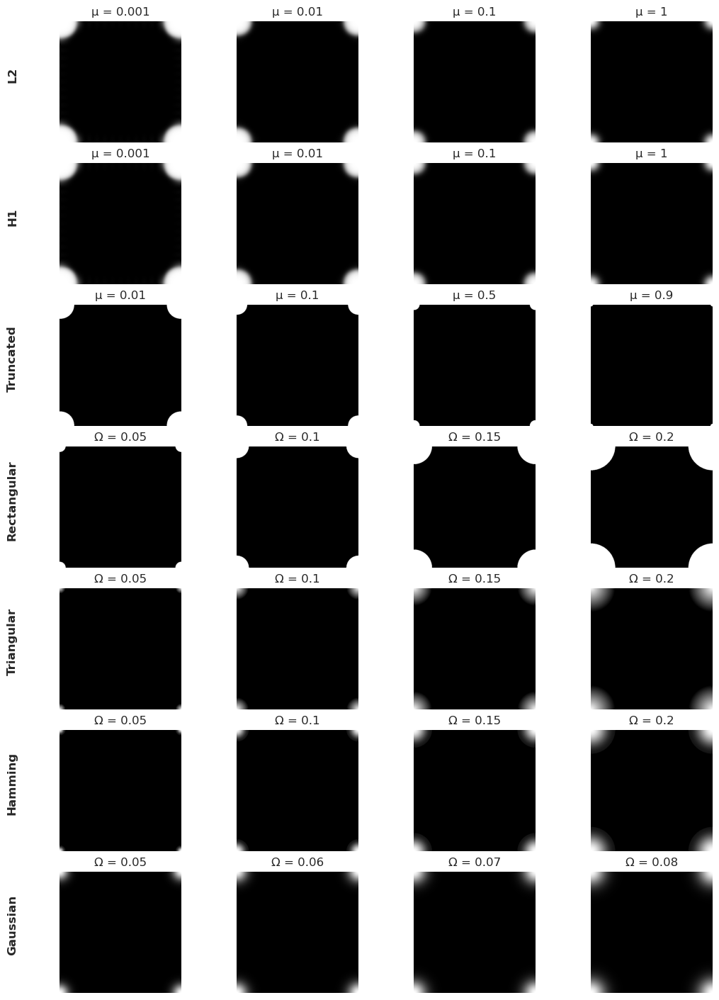

In [21]:
# -------------------- Plot All Window Functions --------------------

def plot_all_windows(kernel, shape, mu_values_L2_H1, mu_values_truncated, big_omega_values, big_omega_values_gaussian):
    """
    Plots all window functions for different parameter values.
    
    Parameters:
        - kernel: Blurring kernel.
        - shape: Shape of the image.
        - mu_values_L2_H1: List of mu values for L2 and H1 regularization.
        - mu_values_truncated: List of mu values for the truncated window.
        - big_omega_values: List of big_omega values for the other windows.
        - big_omega_values_gaussian: List of big_omega values for the Gaussian window.

    Returns: None
    """
    
    omega1, omega2 = compute_frequency_grid(shape)
    K_hat = fft2(kernel, s=shape)

    # Define window functions
    # we make this dictionary because we have different parameters/input
    # {name: (function, parameter_name, parameter_values)}
    window_functions_params = {
        "L2": (lambda mu: L2_window(K_hat, mu).real, "μ", mu_values_L2_H1),
        "H1": (lambda mu: H1_window(K_hat, mu).real, "μ", mu_values_L2_H1),
        "Truncated": (lambda mu: truncated_window_function(K_hat, mu).real, "μ", mu_values_truncated),
        "Rectangular": (lambda big_omega: rectangular_window(omega1, omega2, big_omega), "Ω", big_omega_values),
        "Triangular": (lambda big_omega: triangular_window(omega1, omega2, big_omega), "Ω", big_omega_values),
        "Hamming": (lambda big_omega: generalized_hamming_window(omega1, omega2, big_omega), "Ω", big_omega_values),
        "Gaussian": (lambda big_omega: gaussian_window(omega1, omega2, big_omega), "Ω", big_omega_values_gaussian),
    }

    n_rows = len(window_functions_params)
    n_cols = len(mu_values_L2_H1)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2 * n_cols + 2, 2 * n_rows), constrained_layout=True)

    for row, (name, (func, param_name, param_values)) in enumerate(window_functions_params.items()):

        for col, param_value in enumerate(param_values):
            # Compute window function for given parameter value
            W = func(param_value)
            
            ax = axes[row, col]
            im = ax.imshow(W, cmap="gray", extent=[-0.5, 0.5, -0.5, 0.5])
            ax.axis("off")
            ax.set_title(f"{param_name} = {param_value}", fontsize=12)

    # Add title on the left (window name)
    for row, (name, _) in enumerate(window_functions_params.items()):
        fig.text(-0.02, 1 - (row + 0.5) / n_rows, name, va='center', ha='right', fontsize=12, fontweight='bold', rotation=90)

    plt.show()

shape = (512, 512)
mu_values_L2_H1 = [1e-3, 1e-2, 1e-1, 1] # params for L2 and H1 regularization
mu_values_truncated = [1e-2, 1e-1, 0.5, 0.9]  # params for the truncated window
big_omega_values = [0.05, 0.1, 0.15, 0.2] # params for the other windows
big_omega_values_gaussian = [0.05, 0.06, 0.07, 0.08] # params for the gaussian window

plot_all_windows(kernel, shape, mu_values_L2_H1, mu_values_truncated, big_omega_values, big_omega_values_gaussian)


From this look we can have an idea of the function, but we can't really see how it decays to 0... Now we are going to see a **slice of the function**, so we can study better the behaviour. The 1D slice is taken diagonally, so we don't see strange artifacts by taking the border. the functions are all simmetric so we don't get any problem.

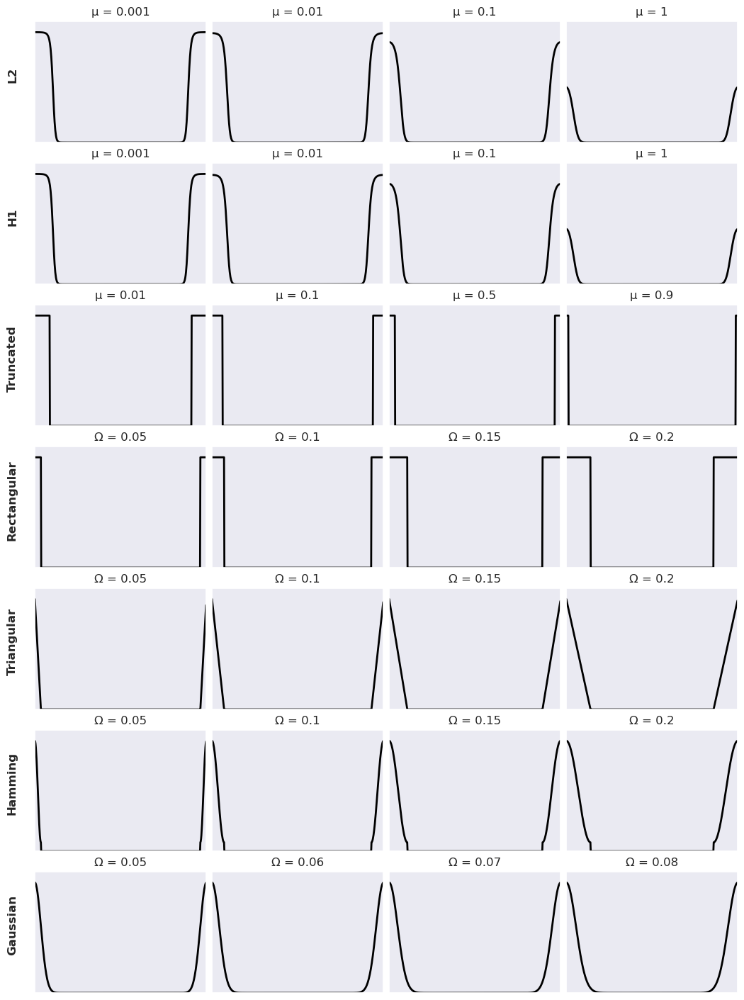

In [22]:
### Plot 1D Slices of the Window Functions ###

def plot_1d_slices_windows(kernel, shape, mu_values_L2_H1, mu_values_truncated, big_omega_values, big_omega_values_gaussian):
    """
    Plots 1D slices of all window functions for different parameter values.
    
    Parameters:
        - kernel: Blurring kernel.
        - shape: Shape of the image.
        - mu_values_L2_H1: List of mu values for L2 and H1 regularization.
        - mu_values_truncated: List of mu values for the truncated window.
        - big_omega_values: List of big_omega values for the other windows.
        - big_omega_values_gaussian: List of big_omega values for the Gaussian window.

    Returns: None
    """

    omega1, omega2 = compute_frequency_grid(shape)
    K_hat = fft2(kernel, s=shape)

    # Define window functions
    # we make this dictionary because we have different parameters/input
    # {name: (function, parameter_name, parameter_values)}
    window_functions_params = {
        "L2": (lambda mu: L2_window(K_hat, mu).real, "μ", mu_values_L2_H1),
        "H1": (lambda mu: H1_window(K_hat, mu).real, "μ", mu_values_L2_H1),
        "Truncated": (lambda mu: truncated_window_function(K_hat, mu).real, "μ", mu_values_truncated),
        "Rectangular": (lambda big_omega: rectangular_window(omega1, omega2, big_omega), "Ω", big_omega_values),
        "Triangular": (lambda big_omega: triangular_window(omega1, omega2, big_omega), "Ω", big_omega_values),
        "Hamming": (lambda big_omega: generalized_hamming_window(omega1, omega2, big_omega), "Ω", big_omega_values),
        "Gaussian": (lambda big_omega: gaussian_window(omega1, omega2, big_omega), "Ω", big_omega_values_gaussian),
    }

    n_rows = len(window_functions_params)
    n_cols = len(mu_values_L2_H1)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2 * n_cols + 2, 2 * n_rows), constrained_layout=True)

    for row, (name, (func, param_name, param_values)) in enumerate(window_functions_params.items()):

        for col, param_value in enumerate(param_values):
            W = func(param_value)  # Compute window function for given mu

            ax = axes[row, col]

            # Extract the 1D slice along the DIAGONAL
            # we know the nature of this window functions, they are simmetric and decay to 0 in the middle
            # we take the diagonal and not for example the first row,
            # so we don't get strange artifacts, given by being attached to the border
            x_axis = np.linspace(-0.5, 0.5, W.shape[1])  # X-axis scale
            diagonal_indices = np.arange(min(W.shape))  # Get indices along the diagonal
            y_values = W[diagonal_indices, diagonal_indices]  # Extract diagonal values

            sns.lineplot(x=x_axis, y=y_values, ax=ax, color="black", lw=2)
            ax.set_ylim(0, 1.1)  # Keep consistent scaling for better comparison
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlim(-0.5, 0.5)
            ax.set_title(f"{param_name} = {param_value}", fontsize=12)

    # Add title on the left (window name)
    for row, (name, _) in enumerate(window_functions_params.items()):
        fig.text(-0.02, 1 - (row + 0.5) / n_rows, name, va='center', ha='right', fontsize=12, fontweight='bold', rotation=90)

    plt.show()

shape = (512, 512)
mu_values_L2_H1 = [1e-3, 1e-2, 1e-1, 1] # params for L2 and H1 regularization
mu_values_truncated = [1e-2, 1e-1, 0.5, 0.9]  # params for the truncated window
big_omega_values = [0.05, 0.1, 0.15, 0.2] # params for the other windows
big_omega_values_gaussian = [0.05, 0.06, 0.07, 0.08] # params for the gaussian window

plot_1d_slices_windows(kernel, shape, mu_values_L2_H1, mu_values_truncated, big_omega_values, big_omega_values_gaussian)


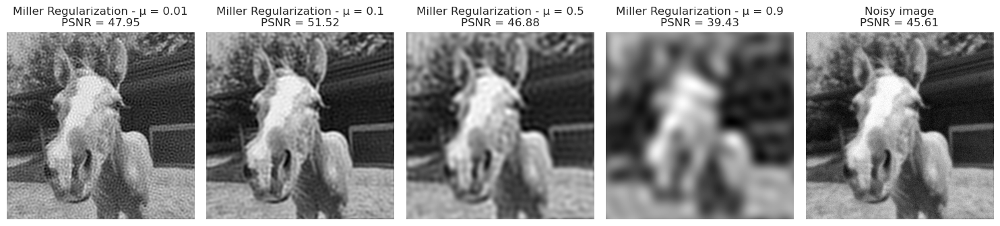

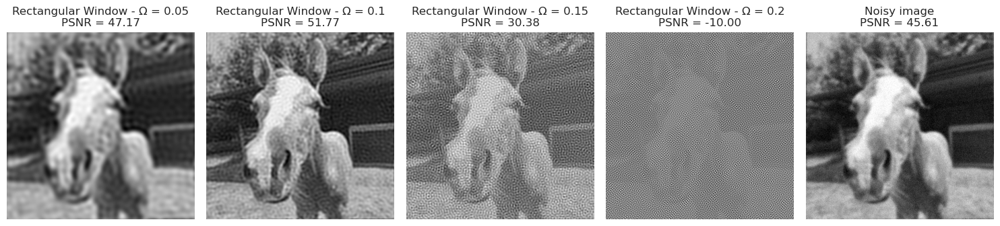

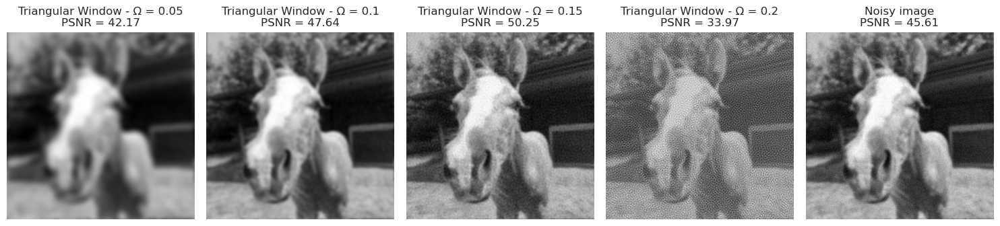

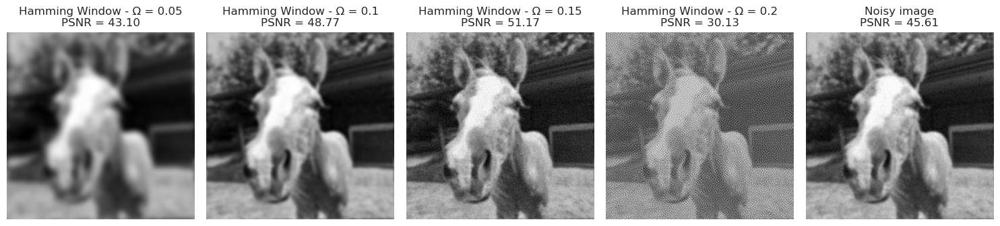

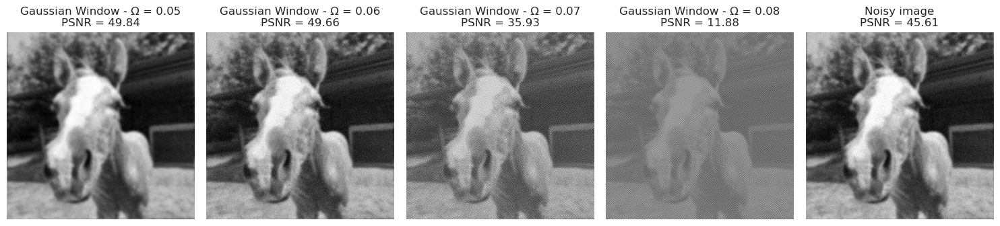

In [23]:
from functools import partial

### RUN EXPERIMENTS ###

mu_values = [1e-2, 1e-1, 0.5, 0.9]
deconvolve_with_truncated_window = partial(deconvolve_with_kernel_window, window_function=truncated_window_function)
psnr_values_truncatedW = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, mu_values, 
                                                 deconvolve_with_truncated_window, deconvolve_method_str="Miller Regularization")

big_omega_values = [0.05, 0.1, 0.15, 0.2]
deconvolve_with_rectangular_window = partial(deconvolve_with_frequency_window, window_function=rectangular_window)
psnr_values_recW = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, big_omega_values, 
                                           deconvolve_with_rectangular_window, deconvolve_method_str="Rectangular Window", param_name="Ω")

deconvolve_with_triangular_window = partial(deconvolve_with_frequency_window, window_function=triangular_window)
psnr_values_triW = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, big_omega_values, 
                                           deconvolve_with_triangular_window, deconvolve_method_str="Triangular Window", param_name="Ω")

deconvolve_with_hamming_window = partial(deconvolve_with_frequency_window, window_function=generalized_hamming_window)
psnr_values_hamW = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, big_omega_values, 
                                           deconvolve_with_hamming_window, deconvolve_method_str="Hamming Window", param_name="Ω")

big_omega_values_gaussian = [0.05, 0.06, 0.07, 0.08]
deconvolve_with_gaussian_window = partial(deconvolve_with_frequency_window, window_function=gaussian_window)
psnr_values_gauW = plot_deconvolved_images(img, noisy_img, noisy_img_input, kernel, big_omega_values_gaussian, 
                                           deconvolve_with_gaussian_window, deconvolve_method_str="Gaussian Window", param_name="Ω")


Best μ for Miller Reg.   : 0.1 , PSNR = 51.52
Best Ω for Rectangular W.: 0.1 , PSNR = 51.77
Best Ω for Triangular W. : 0.15, PSNR = 50.25
Best Ω for Hamming W.    : 0.15, PSNR = 51.17
Best Ω for Gaussian W.   : 0.05, PSNR = 49.84


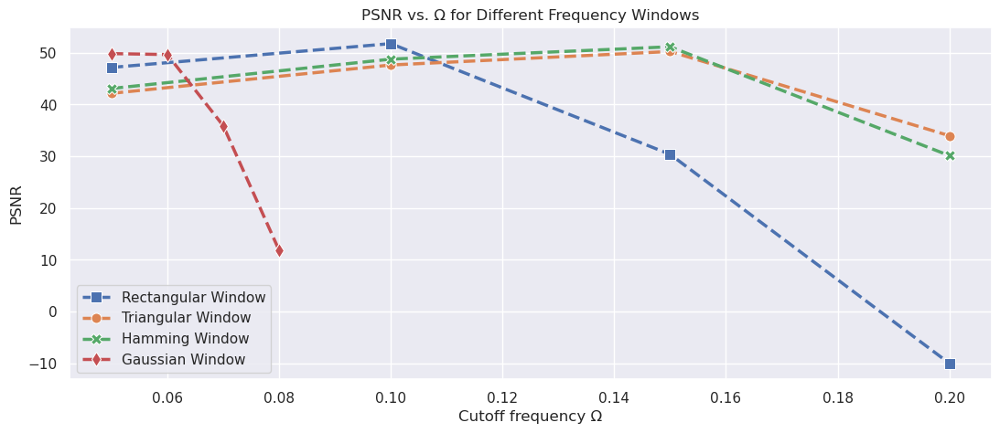

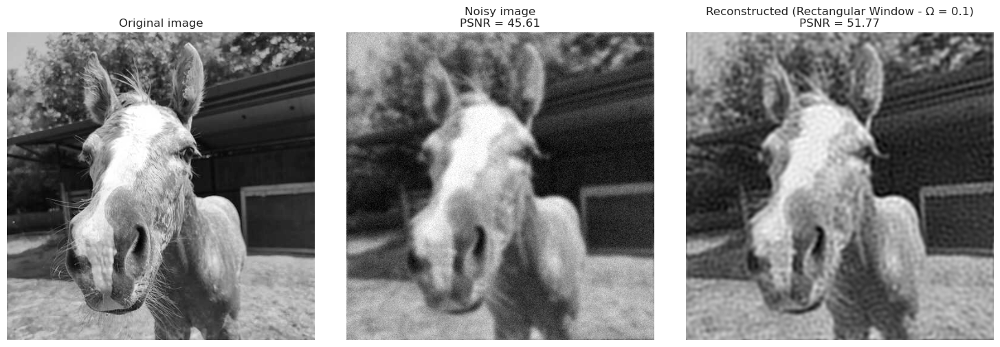

In [24]:
# print best 
print(f"Best μ for Miller Reg.   : {mu_values[np.argmax(psnr_values_truncatedW)]:<4}, PSNR = {np.max(psnr_values_truncatedW):.2f}")
print(f"Best Ω for Rectangular W.: {big_omega_values[np.argmax(psnr_values_recW)]:<4}, PSNR = {np.max(psnr_values_recW):.2f}")
print(f"Best Ω for Triangular W. : {big_omega_values[np.argmax(psnr_values_triW)]:<4}, PSNR = {np.max(psnr_values_triW):.2f}")
print(f"Best Ω for Hamming W.    : {big_omega_values[np.argmax(psnr_values_hamW)]:<4}, PSNR = {np.max(psnr_values_hamW):.2f}")
print(f"Best Ω for Gaussian W.   : {big_omega_values[np.argmax(psnr_values_gauW)]:<4}, PSNR = {np.max(psnr_values_gauW):.2f}")
    
plt.figure(figsize=(13, 5))

sns.lineplot(x=big_omega_values, y=psnr_values_recW, marker="s", linestyle="--", linewidth=2.5, markersize=8, label="Rectangular Window")
sns.lineplot(x=big_omega_values, y=psnr_values_triW, marker="o", linestyle="--", linewidth=2.5, markersize=8, label="Triangular Window")
sns.lineplot(x=big_omega_values, y=psnr_values_hamW, marker="X", linestyle="--", linewidth=2.5, markersize=8, label="Hamming Window")
sns.lineplot(x=big_omega_values_gaussian, y=psnr_values_gauW, marker="d", linestyle="--", linewidth=2.5, markersize=8, label="Gaussian Window")

plt.xlabel("Cutoff frequency Ω")
plt.ylabel("PSNR")
plt.title("PSNR vs. Ω for Different Frequency Windows")
plt.legend()
plt.show()

best_big_omega = 0.1
best_reconstructed = deconvolve_with_rectangular_window(noisy_img_input, kernel, best_big_omega)
compare_images(img, noisy_img, best_reconstructed, param_val_str=str(best_big_omega), method_str="Rectangular Window", param_name="Ω")

The best reconstruction is given by the Rectangular window with $\Omega = 0.1$.